In [1]:
import layoutparser as lp

In [2]:
model = lp.Detectron2LayoutModel(
            config_path ='lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config', # In model catalog
            label_map   ={1:"TextRegion", 2:"ImageRegion", 3:"TableRegion", 4:"MathsRegion", 5:"SeparatorRegion", 6:"OtherRegion"}, # In model`label_map`
            extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8] # Optional
        )

config.yaml?dl=1: 8.19kB [00:01, 6.10kB/s]
model_final.pth?dl=1: 351MB [01:11, 4.95MB/s] 
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


In [9]:
import cv2
im = cv2.imread('../data/prima/Images/00000085.tif')

/home/georgi006/.local/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [10]:
layout_predicted = model.detect(im)

/home/georgi006/.local/lib/python3.8/site-packages/detectron2/structures/image_list.py:99: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/home/georgi006/.local/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [15]:
layout_predicted

/home/georgi006/.local/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Layout(_blocks=[TextBlock(block=Rectangle(x_1=302.7784729003906, y_1=3150.117919921875, x_2=982.6621704101562, y_2=3171.6298828125), text=None, id=None, type=TextRegion, parent=None, next=None, score=0.9999358654022217), TextBlock(block=Rectangle(x_1=392.5238342285156, y_1=2254.1796875, x_2=751.8941040039062, y_2=2475.1572265625), text=None, id=None, type=ImageRegion, parent=None, next=None, score=0.9999146461486816), TextBlock(block=Rectangle(x_1=168.0535430908203, y_1=626.3924560546875, x_2=2177.760009765625, y_2=1259.4981689453125), text=None, id=None, type=TextRegion, parent=None, next=None, score=0.9999123811721802), TextBlock(block=Rectangle(x_1=183.8436279296875, y_1=3141.311767578125, x_2=224.98924255371094, y_2=3167.74755859375), text=None, id=None, type=TextRegion, parent=None, next=None, score=0.9999098777770996), TextBlock(block=Rectangle(x_1=809.7702026367188, y_1=1345.6290283203125, x_2=2163.76611328125, y_2=2571.49365234375), text=None, id=None, type=TextRegion, parent=N

/home/georgi006/.local/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


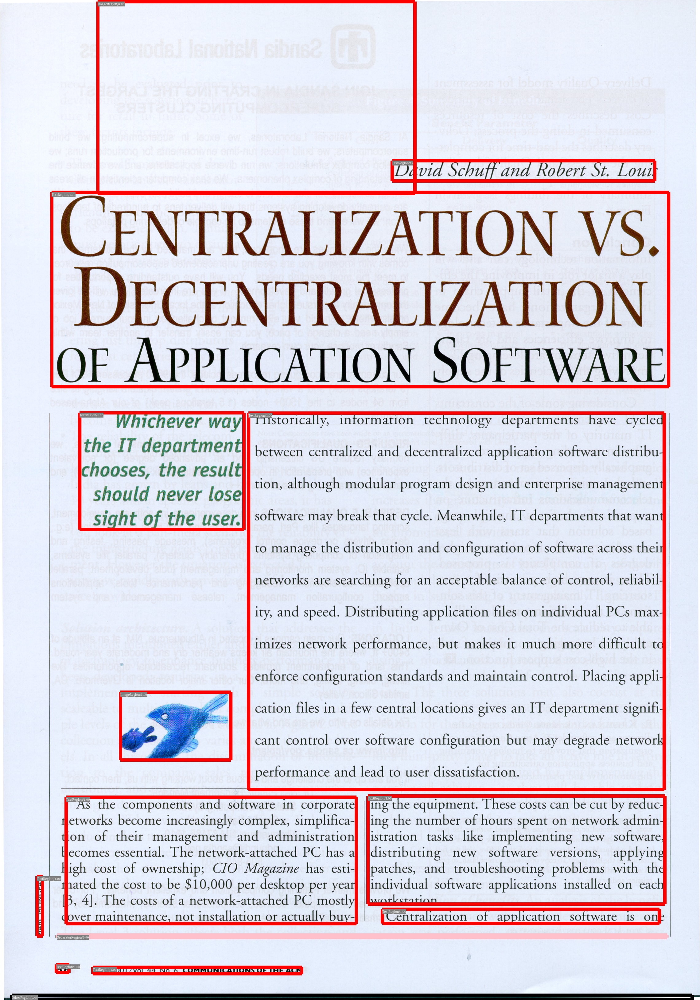

In [14]:
color_map = {'TextRegion':'red', 'ImageRegio':'blue', "TableRegion":'purple', "MathsRegion": 'yellow', "SeparatorRegion": 'pink', "OtherRegion": 'black'}

lp.draw_box(im, 
              [b.set(id=f'{b.type}/{b.score:.2f}') for b in layout_predicted],
              color_map=color_map,
              show_element_id=True, id_font_size=10, 
              id_text_background_color='grey',
              id_text_color='white')